In [1]:
library(IRdisplay)
display_html("<style>.container { width:100% !important; }</style>")

.libPaths()

[1] "/hps/software/users/marioni/Leah/miniconda3/envs/basic_renv/lib/R/library"

In [2]:
suppressPackageStartupMessages(library(data.table))
suppressPackageStartupMessages(library(ggplot2))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(Seurat))
suppressPackageStartupMessages(library(viridis))
suppressPackageStartupMessages(library(Matrix))
suppressPackageStartupMessages(library(stringr))
source('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/gastruloids_scRNAseq/plotting_settings.R')

In [3]:
srat <- readRDS("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/seurat_final.rds")
srat

An object of class Seurat 
30406 features across 77683 samples within 1 assay 
Active assay: RNA (30406 features, 4214 variable features)
 2 dimensional reductions calculated: pca, umap

## Explanation of what's in srat:

This is a seurat object containing all cells that passed QC, and all 30406 cellranger genes.

## `srat@meta.data`
This is the cell metadata table. It has the following columns:
- cell is the cell i.d.
- X1 is UMAP dimension 1 of the UMAP you know and (I hope) love
- X2 is UMAP dimension 2 of the UMAP you know and (well, maybe this is me overidentifying with my work, but hey that's science) love
- orig.ident just says that this is a cell (idk why I include it, legacy I think)
- nCount_RNA are the number of UMIs in that cell
- nFeature_RNA are the number of unique genes in that cell
- barcode is the 10X barcode the cell had
- experiment is which experiment that cell came from. The experiments are gastr_d3, gastr_d4, exp1_d5, exp3B_d4_d4.5, exp3C_d4_d4.5, exp5_d3.5_d4, exp6_d4.5_d5, exp4_d3. I remove all cells from exp2A_d3_d3.5 and exp2C_d3_d3.5 due to low quality
- timepoint is which timepoint the data is from. This includes deconvolves the timepoint based on the MULTI-seq assignment (note there are still some ambiguous timepoints "d3.5_d4", "d4_d4.5", "d4.5_d5" where the MULTI-seq couldn't be assigned)
- organoid is which organoid type (all gastr, but this is a legacy code from when we did organoid comparisons)
- tech is whether it's regular 10X or MULTI
- class is what kind of gastruloid so "gastr_[tp]", again this is rather legacy
- lane which lane it was sequenced on, where specified
- batch, which batch the cell was in (so [experiment]_[sample])
- percent.mt is what percentage of the reads come from mitochondrial genes
- percent.ribo is what percentage of the reads come from ribosomal genes
- ident, again, legacy: These are all cells.
- cxds_score, is from the scds doublet calling (https://www.bioconductor.org/packages/release/bioc/html/scds.html)
- cxds_call, is from the scds doublet calling (https://www.bioconductor.org/packages/release/bioc/html/scds.html)
- bcds_score, is from the scds doublet calling (https://www.bioconductor.org/packages/release/bioc/html/scds.html)
- bcds_call, is from the scds doublet calling (https://www.bioconductor.org/packages/release/bioc/html/scds.html)
- hybrid_score, is from the scds doublet calling (https://www.bioconductor.org/packages/release/bioc/html/scds.html)
- hybrid_call, is from the scds doublet calling (https://www.bioconductor.org/packages/release/bioc/html/scds.html)
- pass_QC is whether the cell passes my final QC
- hybrid_map is how close the cell is to hybrid_called doublets
- hybrid_call2 is whether, based on proximity mapping, I think this cell is a doublet or not (TRUE means not a doublet)
- S.Score is the score Seurat calculates on whether the cell is likely S-phase (based on cc genes)
- G2M.Score is the score Seurat calculates on whether the cell is likely G2 or M-phase (based on cc genes)
- Phase is the cell cycle phase Seurat predicts the cell to be in (based on cc genes)
- MULTI_class is what MULTI_seq barcode the cell likely had
- timepoint.base is the timepoint I give the cell before MULTI-seq demultiplexing
- celltype.mapped is the MNN-based celltype assignment from the extended mouse atlas (the 400,000+ cell one that goes to E9.5)
- stage.mapped is the MNN-based stage assignment from the extended mouse atlas (the 400,000+ cell one that goes to E9.5)
- closest.cell is what the closest in vivo cell after MNN mapping to the extended atlas is
- celltype.score quantifies what proportion of the cell's 30-nearest in vivo cells after MNN mapping to the extended atlas are of the celltype it was assigned
- cellstage.score quantifies what proportion of the cell's 30-nearest in vivo cells after MNN mapping to the extended atlas are of the cellstage it was assigned
- celltype.mapped.descendant is the MNN-based celltype assignment from the original mouse atlas (the 116,312 cell one that goes to E8.5)
- closest.cell.descendant is what the closest in vivo cell after MNN mapping to the original atlas is
- celltype.score.descendant quantifies what proportion of the cell's 30-nearest in vivo cells after MNN mapping to the original atlas are of the celltype it was assigned
- cellstage.score.descendant quantifies what proportion of the cell's 30-nearest in vivo cells after MNN mapping to the original atlas are of the cellstage it was assigned
- percent.mt.normed is the percent.mt column, but normalised by the experiment, to make it comparable across experiments (as percent.mt has significant batch effects)
- nFeature_RNA.normed is the nFeature_RNA column, but normalised by the experiment, to make it comparable across experiments (as nFeature_RNA has significant batch effects)
- RNA_snn_res.0.6 is the Seurat clustering assignment when a resolution of 0.6 is used
- RNA_snn_res.1.5 is the Seurat clustering assignment when a resolution of 1.5 is used
- RNA_snn_res.2 is the Seurat clustering assignment when a resolution of 2 is used
- cluster is my de novo celltype annotation
- gastr_type is the type of gastruloid the cell comes from (neural, meso, intermediate, or NA)
- cellscore this is the normalised embryonic day the cell is assigned
- percent.mt.normed this is the batch-standardised percent.mt
- nFeature_RNA.normed this is the batch-standardised nFeature_RNA
- percent.ribo.normed this is the batch-standardised percent.ribo
- nCount_RNA.normed this is the batch-standardised nCount_RNA
- initial_size_spliced this is calculated by scVelo
- initial_size_unspliced this is calculated by scVelo
- initial_size this is calculated by scVelo
- n_counts
- velocity_self_transition  this is calculated by scVelo
- root_cells this is calculated by scVelo
- end_points this is calculated by scVelo
- velocity_pseudotime this is calculated by scVelo
- day this is the same as timepoint, but renamed for WOT
- proliferation_score this is the proliferation score calculated by WOT
- apoptosis_score this is the apopotosis score calculated by WOT
- growth_rate_init this is the combination of the proliferation and apopotosis score before WOT is actually run
- estimated_growth_rates this is the growth rate after WOT is run, so proportional to how many cells this cell will give rise to.

## `srat@assays$RNA`
This is where the RNA data (all we have here) is stored.

### `srat@assays$RNA@meta.features`
Metadata with details on the features. Contains their ensembl ID (used for indexing them throughout the object), their gene symbol, whether they are mitochondrial, whether they are in my own curated extended list of cell cycle genes. And then if they are an hvg based on various ways of finding hvgs.

### `srat@assays$RNA@var.features`
The identified variable features. These are the variable features that were used for gastruloid-only MNN integration.

### `srat@assays$RNA@counts`
The raw feature by cell count matrix

### `srat@assays$RNA@data`
The normalised feature by cell count matrix (normalised using batchelor's `multiBatchNorm` function (https://rdrr.io/github/LTLA/batchelor/man/multiBatchNorm.html)

## `srat@reductions`
This is where the dimensionality reduction data is stored.

### `srat@reductions$pca`
This is the MNN-integrated PCA space (gastruloid-only MNN-integration)

### `srat@reductions$umap`
This is the UMAP calculated on the MNN-integrated PCA space (using the `umap` function with `random_state=2402`, from the `umap` R-package, https://cran.r-project.org/web/packages/umap/vignettes/umap.html)

### `srat@graphs$RNA_nn`
This is the nearest neighbour graph as calculated by Seurat's FindNeighbors (k=30, using full 50-dimensional MNN-corrected PCA space)

### `srat@graphs$RNA_snn`
This is the shared nearest neighbour graph as calculated by Seurat's FindNeighbors (k=30, using full 50-dimensional MNN-corrected PCA space)

# Below are some example scripts to illustrate usage of the functions in plotting_settings.R

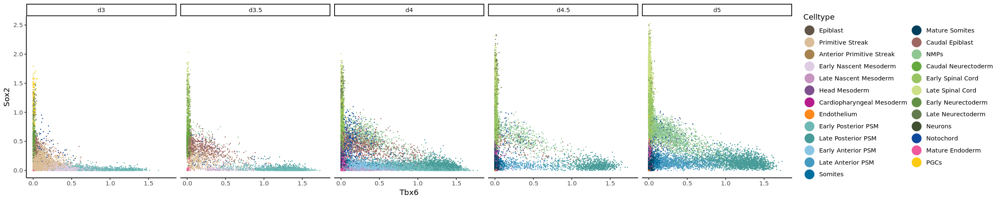

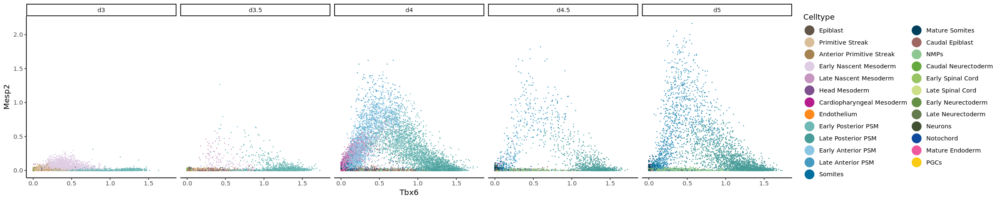

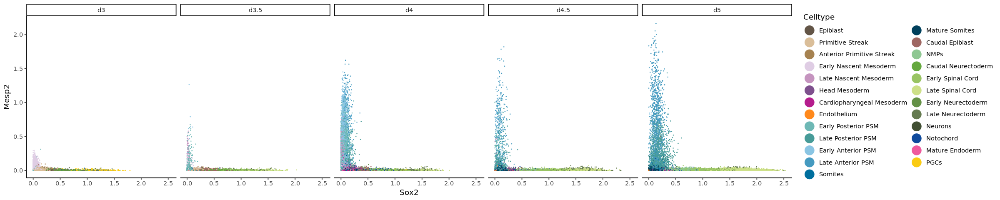

In [4]:
options(repr.plot.width=20, repr.plot.height=4)
plotGeneCorrelation(srat,
                    gene1_symbol="Tbx6",
                    gene2_symbol="Sox2",
                    tp_subset=c("d3", "d3.5", "d4", "d4.5", "d5"),
                    #smoothed=TRUE,
                    #type='normalised',
                    assay='RNA'
                   ) + facet_wrap(~timepoint, nrow = 1)
plotGeneCorrelation(srat,
                    gene1_symbol="Tbx6",
                    gene2_symbol="Mesp2",
                    tp_subset=c("d3", "d3.5", "d4", "d4.5", "d5"),
                    #smoothed=TRUE,
                    #type='normalised',
                    assay='RNA'
                   ) + facet_wrap(~timepoint, nrow = 1)
plotGeneCorrelation(srat,
                    gene1_symbol="Sox2",
                    gene2_symbol="Mesp2",
                    tp_subset=c("d3", "d3.5", "d4", "d4.5", "d5"),
                    #smoothed=TRUE,
                    #type='normalised',
                    assay='RNA'
                   ) + facet_wrap(~timepoint, nrow = 1)

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 15237 rows containing non-finite values (stat_boxplot).”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 39461 rows containing non-finite values (stat_boxplot).”


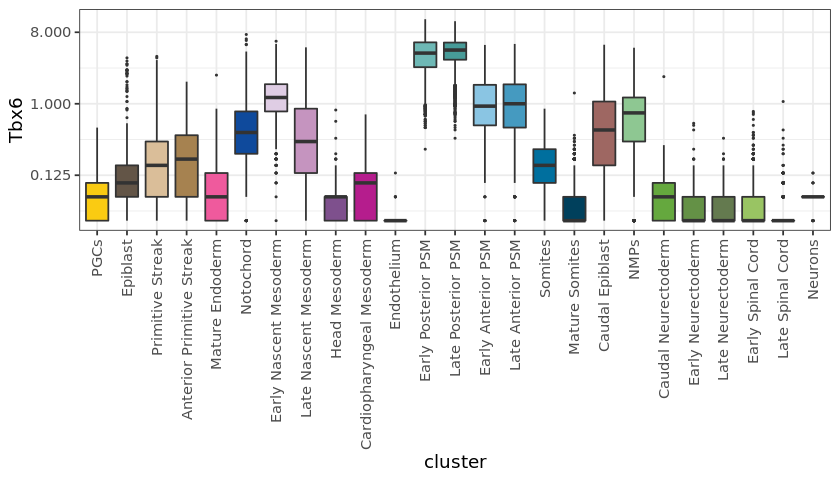

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 2044 rows containing non-finite values (stat_boxplot).”


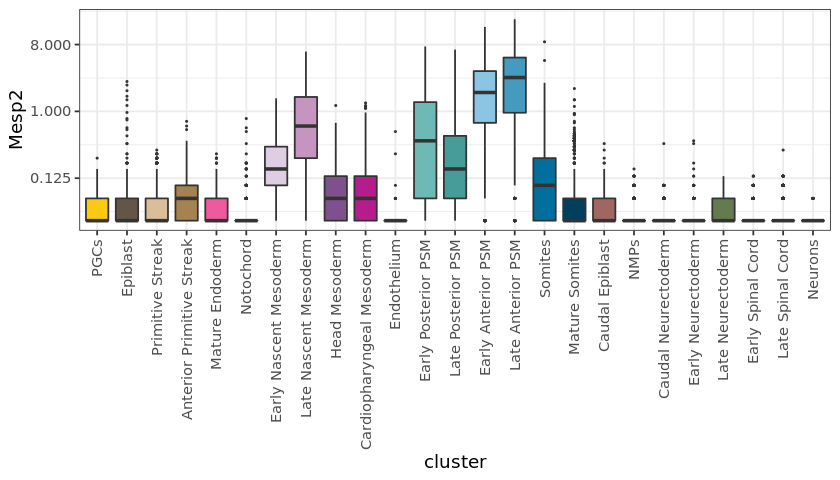

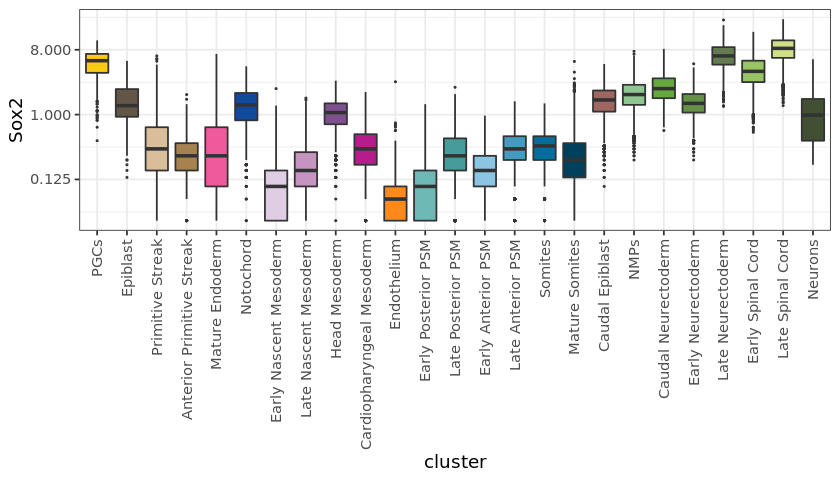

In [5]:
options(repr.plot.width=7, repr.plot.height=4)
plotGeneViolins(srat, gene_symbol = 'Tbx6', plot_type = 'boxplot', smoothed = TRUE)
plotGeneViolins(srat, gene_symbol = 'Mesp2', plot_type = 'boxplot', smoothed = TRUE)
plotGeneViolins(srat, gene_symbol = 'Sox2', plot_type = 'boxplot', smoothed = TRUE)

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 12857 rows containing non-finite values (stat_boxplot).”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 33299 rows containing non-finite values (stat_boxplot).”


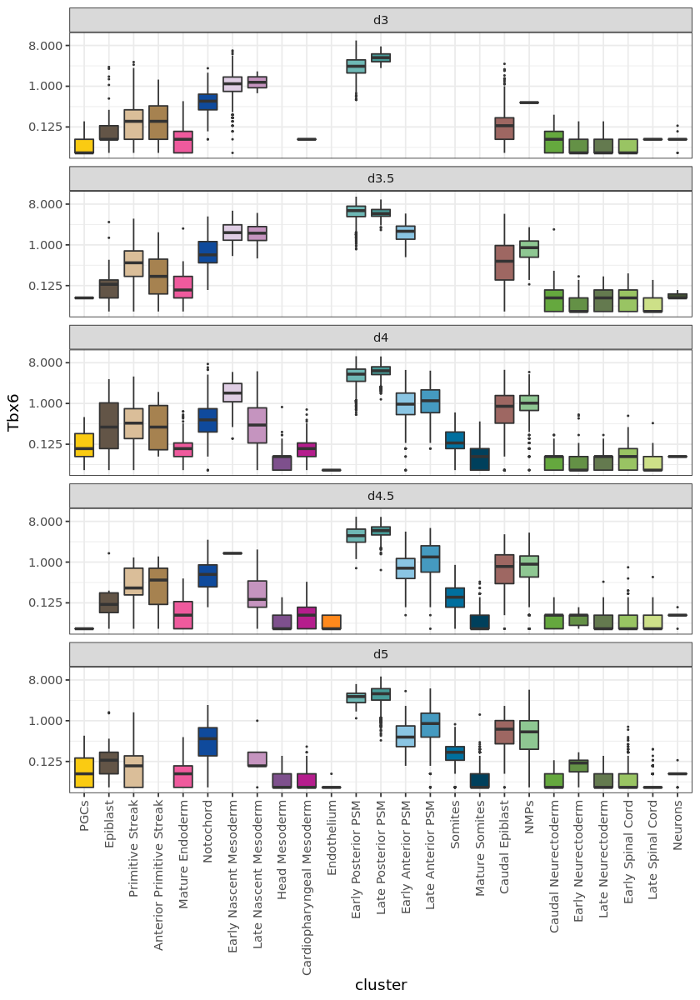

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 1771 rows containing non-finite values (stat_boxplot).”


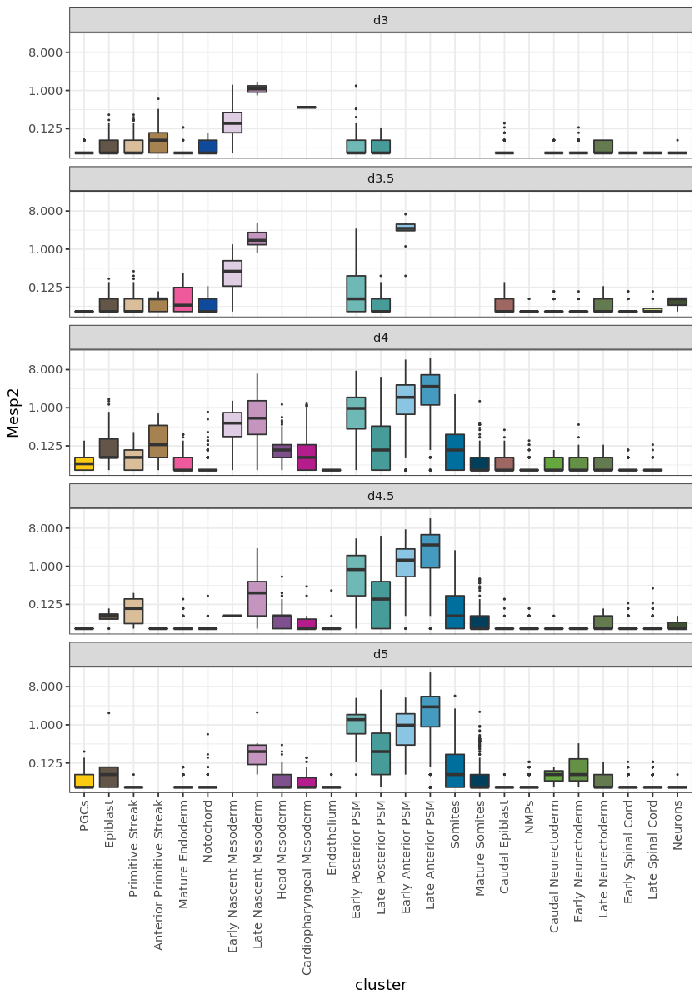

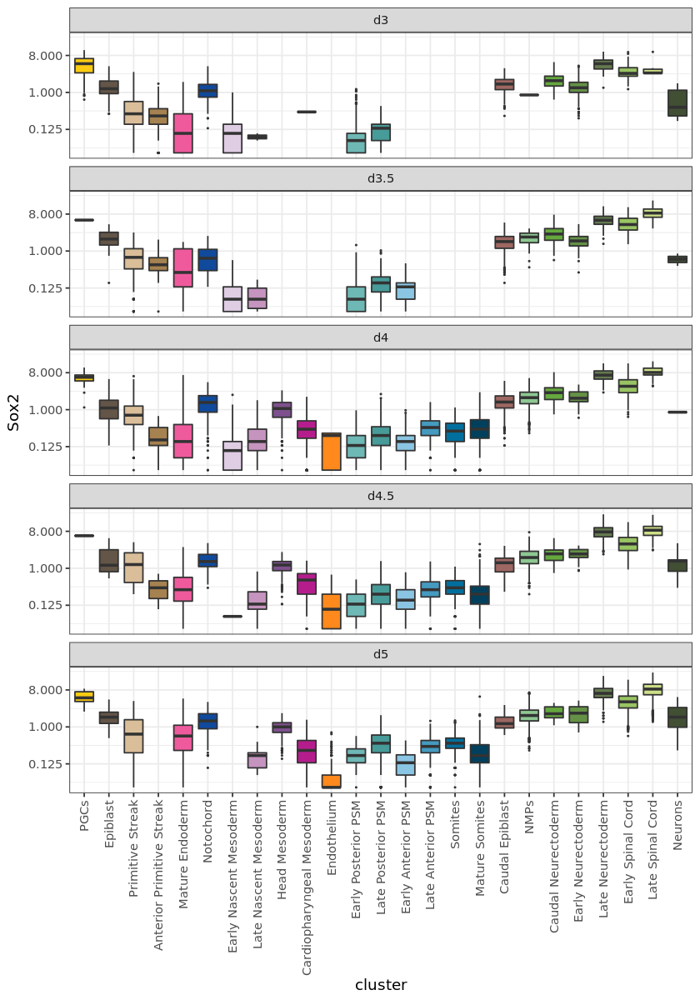

In [6]:
options(repr.plot.width=7, repr.plot.height=10)
p <- plotGeneViolins(srat, gene_symbol = 'Tbx6', plot_type = 'boxplot', smoothed = TRUE, 
                tp_subset = c('d3', 'd3.5', 'd4', 'd4.5', 'd5')
               ) + facet_wrap(~timepoint, ncol=1)
print(p)
p <- plotGeneViolins(srat, gene_symbol = 'Mesp2', plot_type = 'boxplot', smoothed = TRUE, 
                tp_subset = c('d3', 'd3.5', 'd4', 'd4.5', 'd5')
               ) + facet_wrap(~timepoint, ncol=1)
print(p)
p <- plotGeneViolins(srat, gene_symbol = 'Sox2', plot_type = 'boxplot', smoothed = TRUE, 
                tp_subset = c('d3', 'd3.5', 'd4', 'd4.5', 'd5')
               ) + facet_wrap(~timepoint, ncol=1)
print(p)

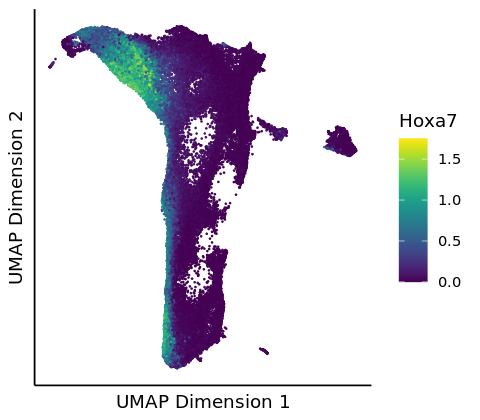

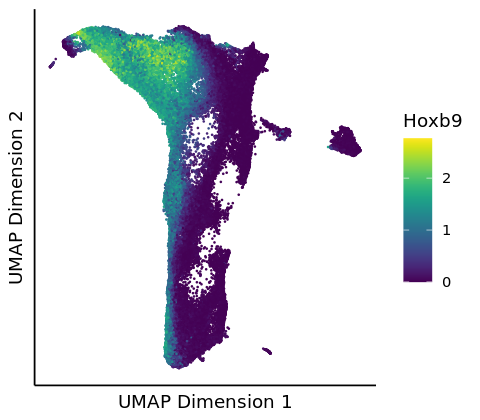

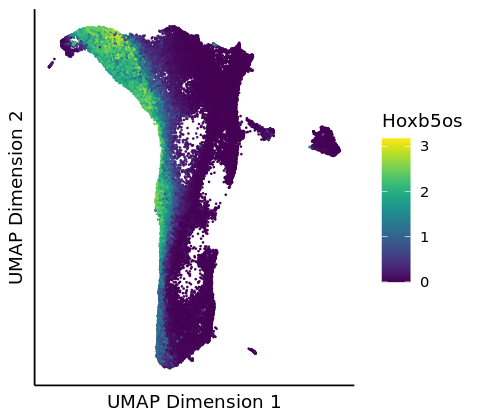

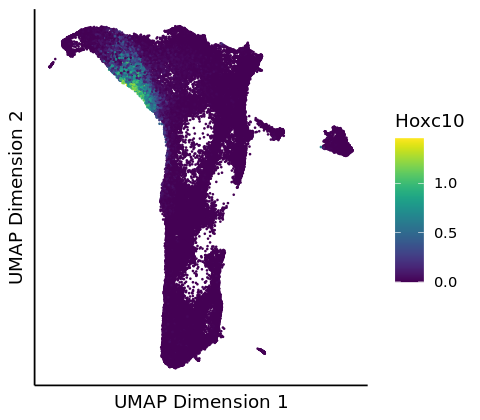

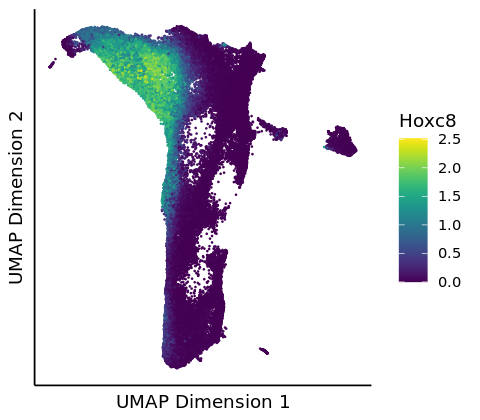

...

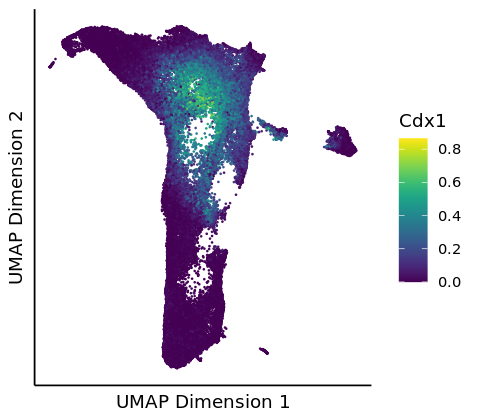

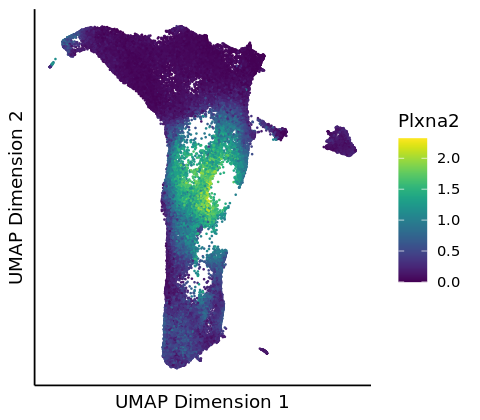

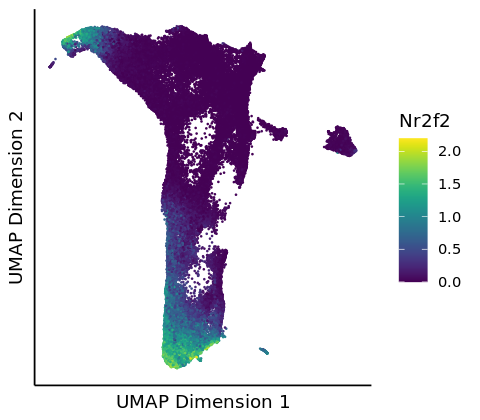

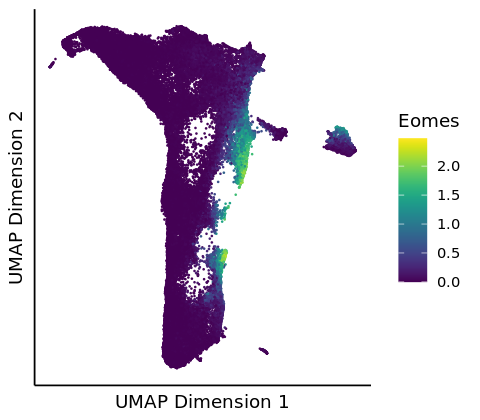

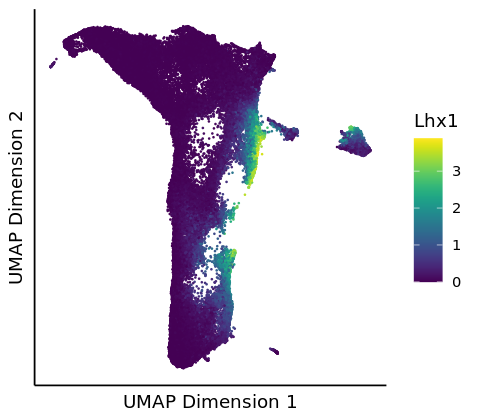

In [7]:
options(repr.plot.width=4, repr.plot.height=3.5)
for (g in c('Hoxa7', 'Hoxb9', 'Hoxb5os', 'Hoxc10', 'Hoxc8', 'Hoxc9', 'Ptprz1', 'Cdx1',
            'Plxna2', 'Nr2f2', 'Eomes', 'Lhx1')) {
    p <- plotExpression_UMAP(srat, gene_symbol=g, smoothed=TRUE, type='normalised' )
    print(p)
}

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 21583 rows containing non-finite values (stat_ydensity).”
Warning message:
“Removed 21583 rows containing non-finite values (stat_boxplot).”


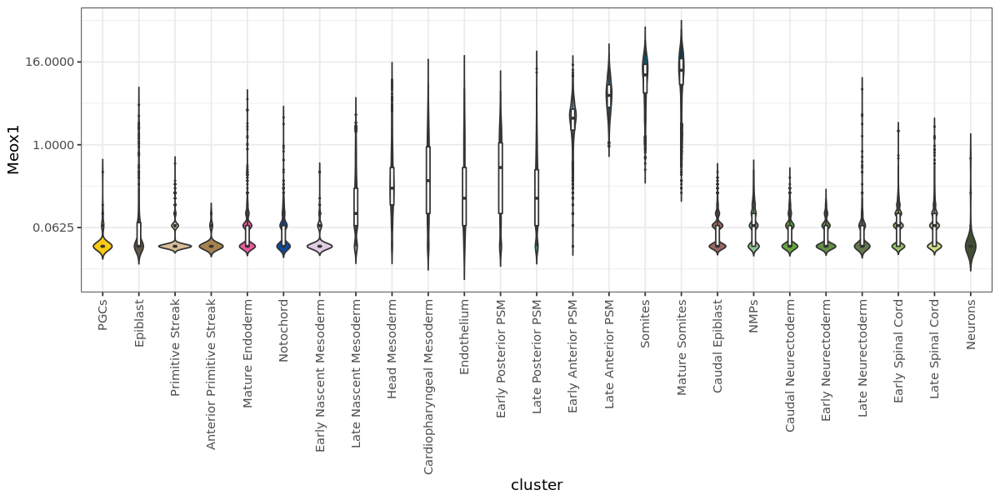

In [8]:
options(repr.plot.width=10, repr.plot.height=5)
plotGeneViolins(srat, gene_symbol = 'Meox1', plot_type = 'violin_w_boxplot', smoothed = TRUE)

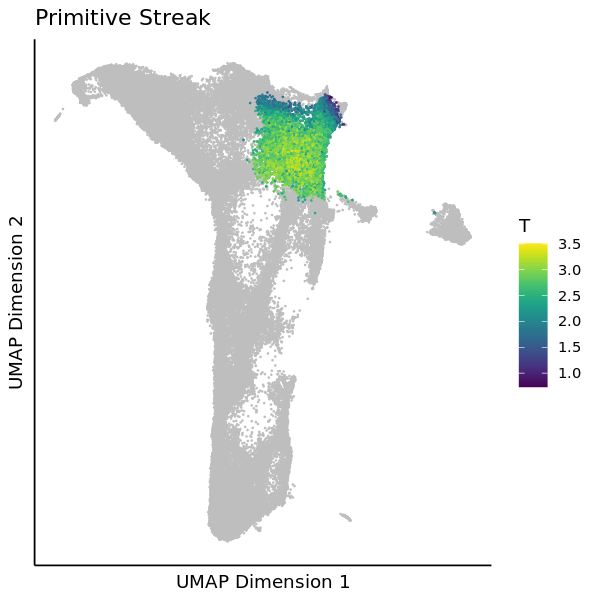

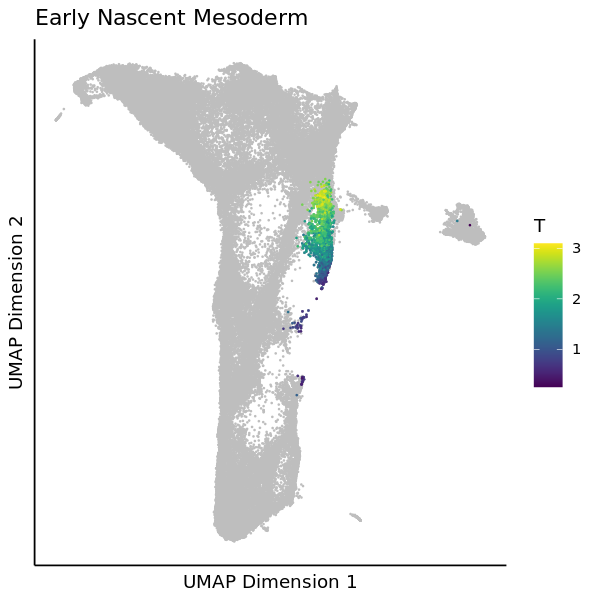

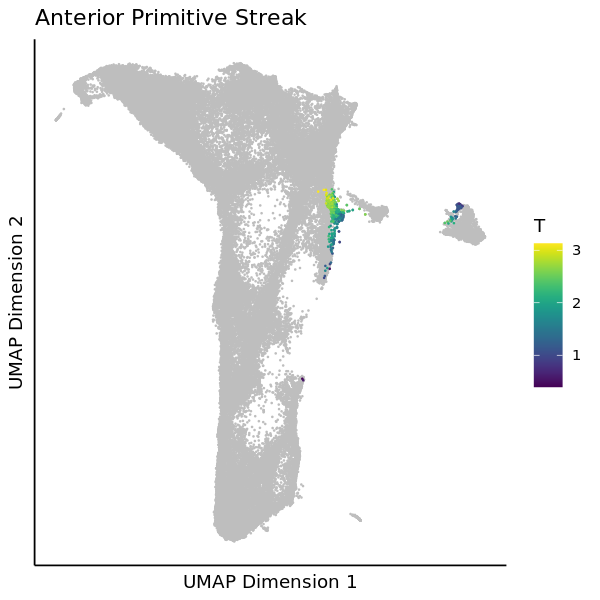

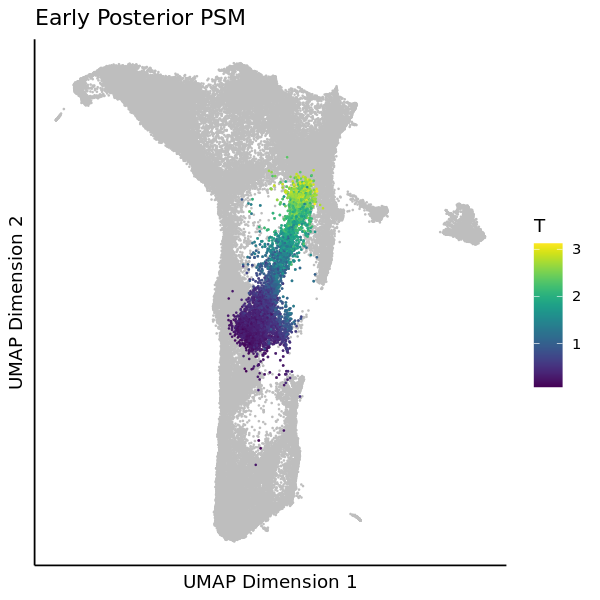

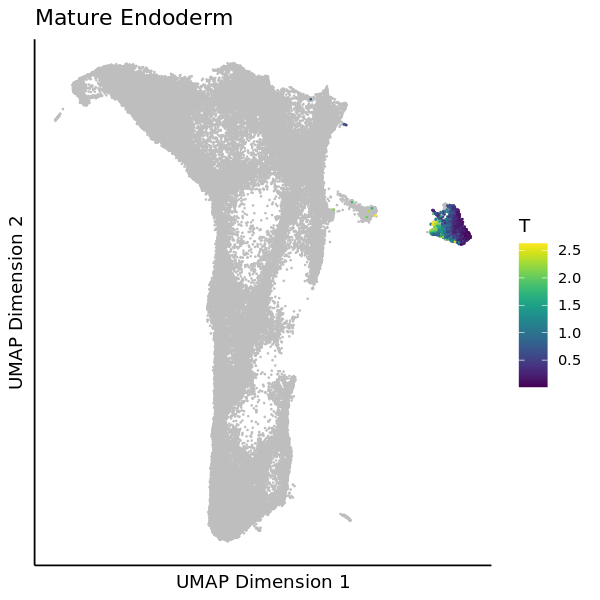

...

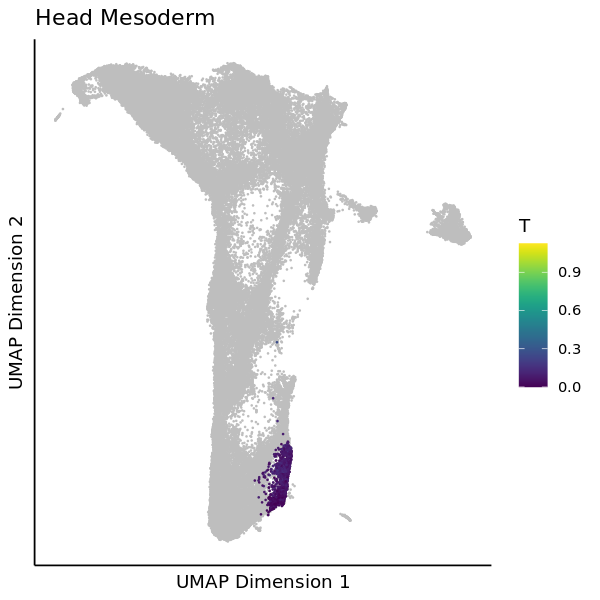

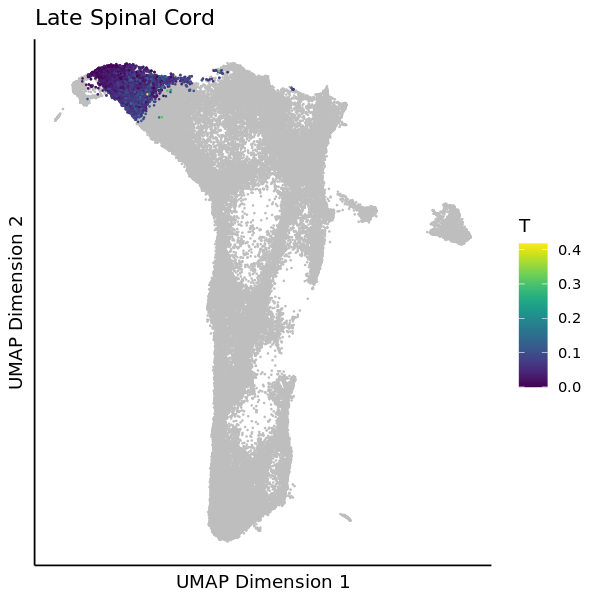

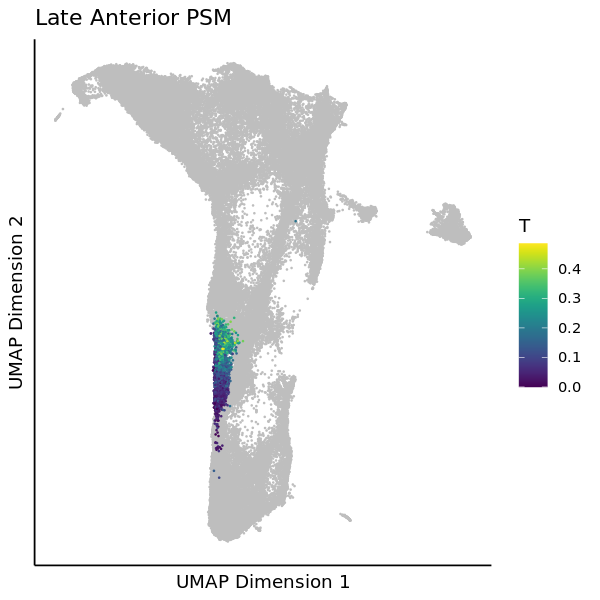

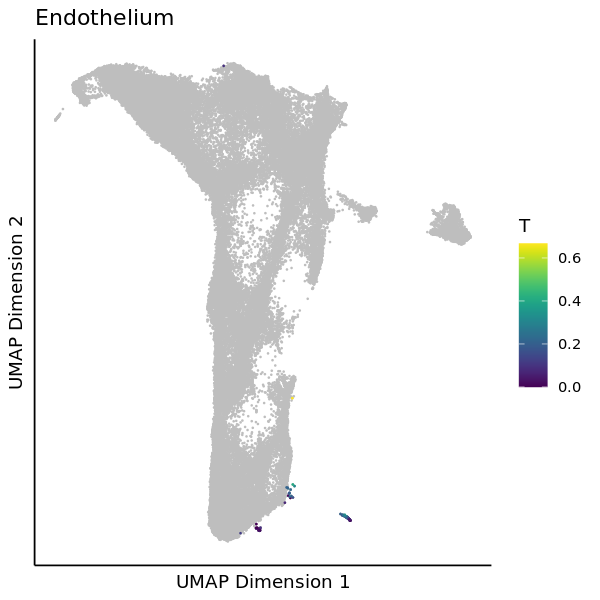

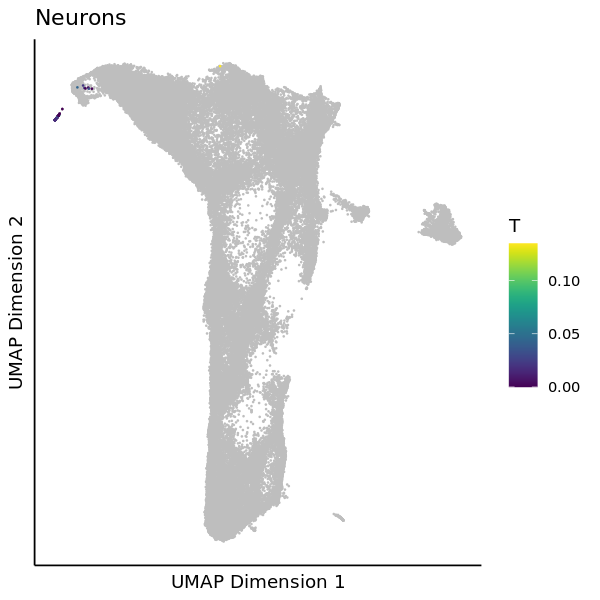

In [9]:
mygene <- 'T'
options(repr.plot.width=5, repr.plot.height=5)
to.plot <- as.data.table(srat@meta.data)
for (ct in unique(to.plot$cluster)) {
    p <- plotExpression_UMAP(srat,
                        gene_symbol=mygene,
                        smoothed=TRUE, type='normalised',
                        cluster_subset = c(ct)
                       ) + 
        ggtitle(ct) +
        geom_point(data=select(as.data.table(srat@meta.data),-cluster), colour="grey", size=0.1, alpha=1) +
        geom_point(size=0.1, alpha=1)
    print(p)
}

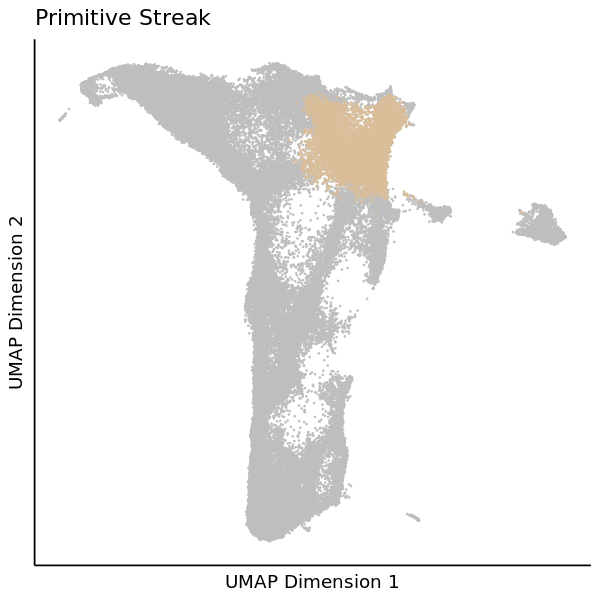

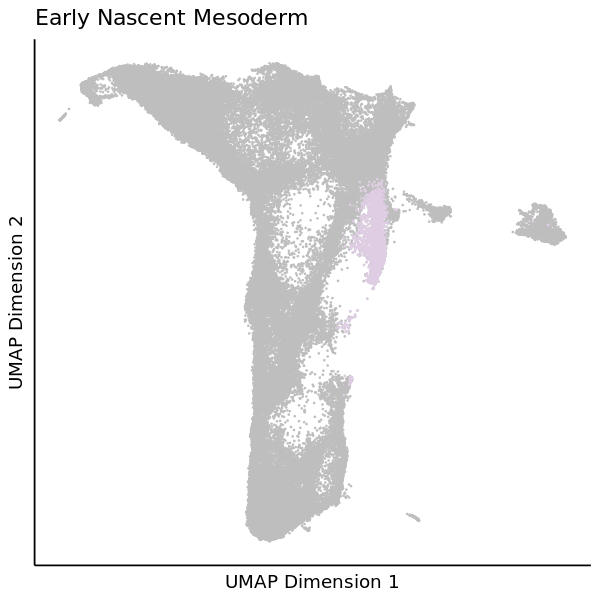

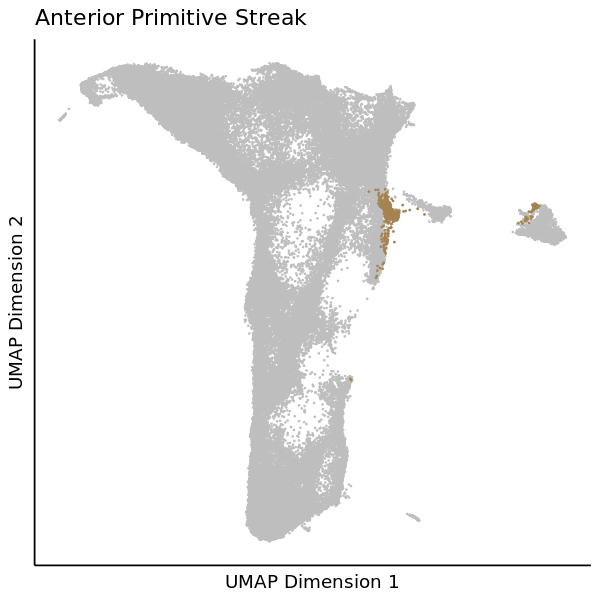

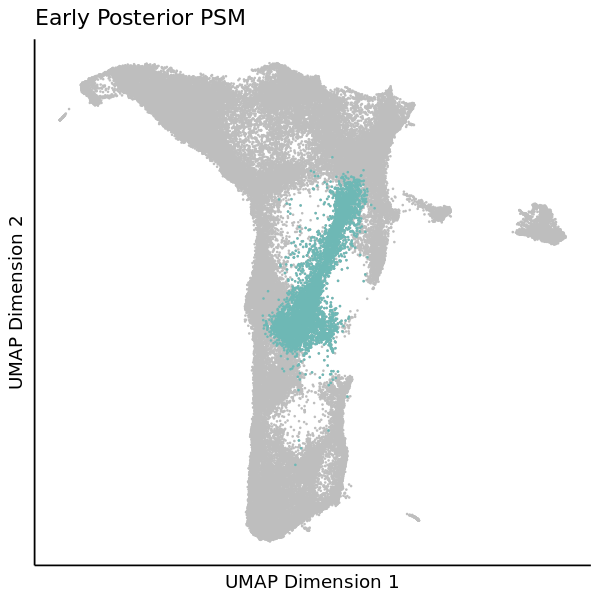

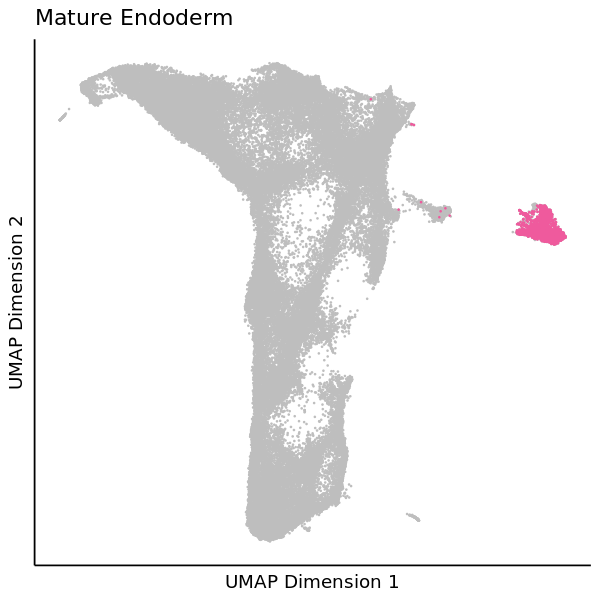

...

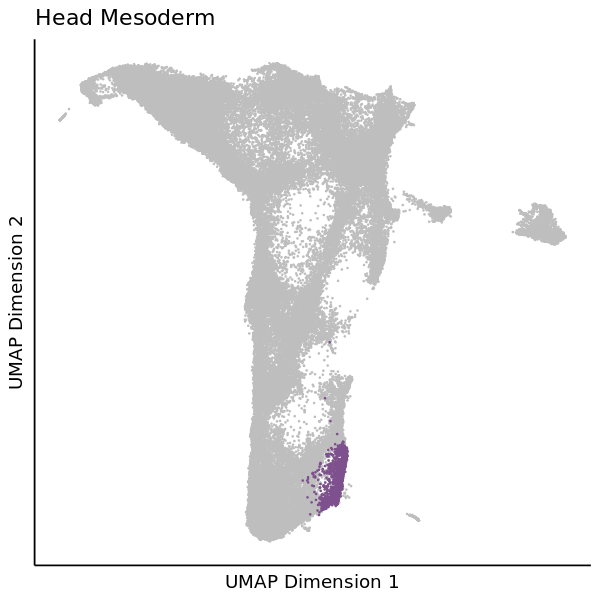

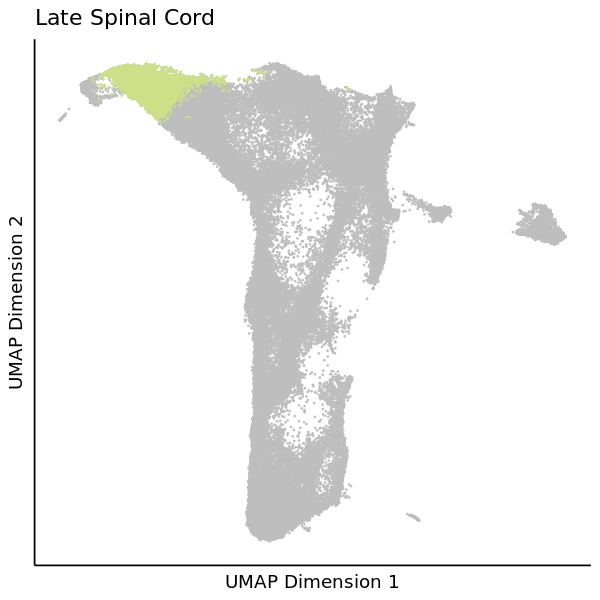

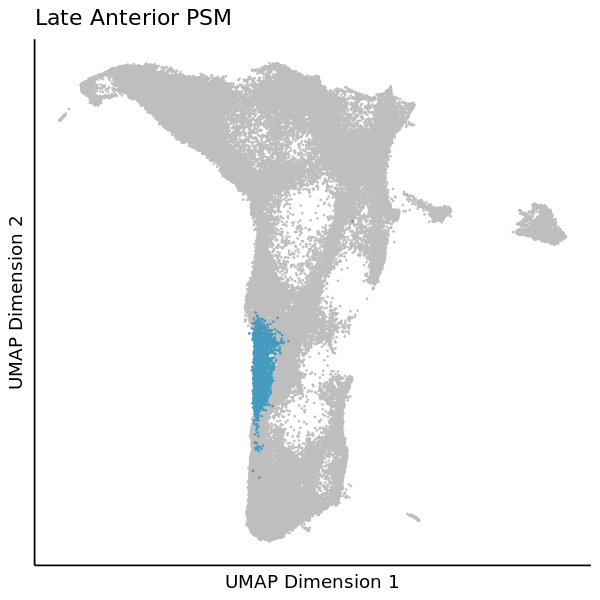

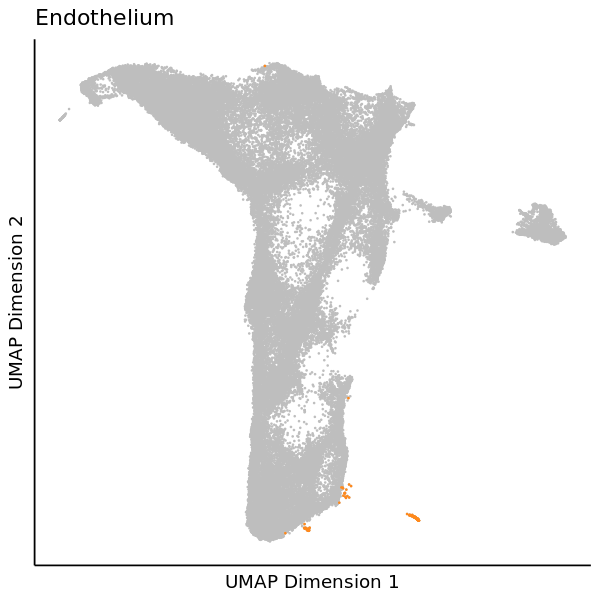

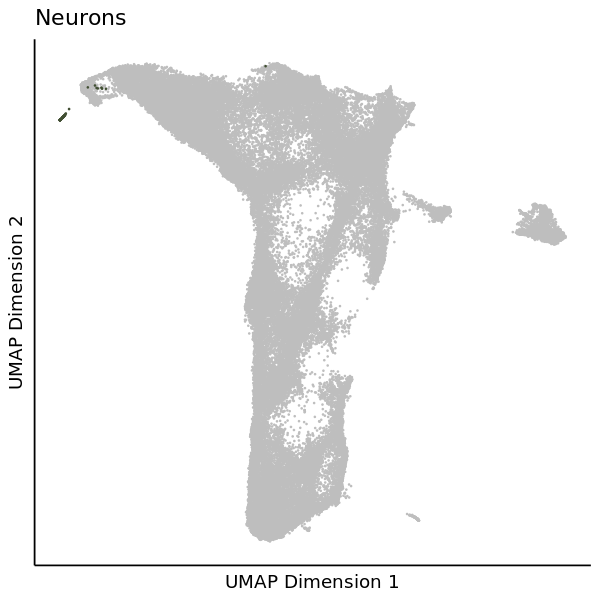

In [10]:
options(repr.plot.width=5, repr.plot.height=5)
to.plot <- as.data.table(srat@meta.data)
for (ct in unique(to.plot$cluster)) {
    p <- ggplot(data=to.plot[cluster==ct], mapping = aes(x=X1, y=X2, colour=cluster)) +
      geom_point(data=select(to.plot,-cluster), colour="grey", size=0.1, alpha=1) +
      geom_point(size=0.1, alpha=1) +
      # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
      labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
      ggtitle(ct) +
      scale_colour_manual(values = cluster_colours, name = "Celltype") +
      guides(colour = guide_legend(override.aes = list(size=6))) +
      theme_classic() +
      theme(legend.position = 'None',
            axis.text=element_blank(),
            axis.ticks = element_blank())
    print(p)
}

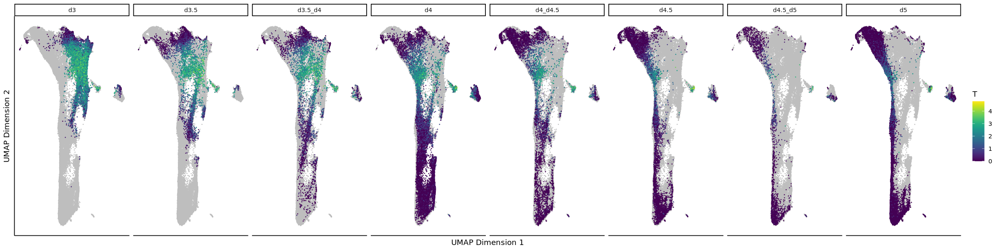

In [11]:
options(repr.plot.width=20, repr.plot.height=5)
plotExpression_UMAP(srat,
                    gene_symbol="T",
                    smoothed=FALSE, type='normalised',
                    #dim1_name='X1_RossiInt', dim2_name='X2_RossiInt',
                    cluster_subset = NULL, tp_subset = NULL, gastr_type_subset = NULL, dataset_subset = NULL,
                    facet_by_c="timepoint", facet_by_r=NULL
                   )

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 1289 rows containing non-finite values (stat_ydensity).”
Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Removed 1289 rows containing non-finite values (stat_boxplot).”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 1289 rows containing non-finite values (stat_ydensity).”
Warning message:
“Groups with fewer than two data points have been dropped.”


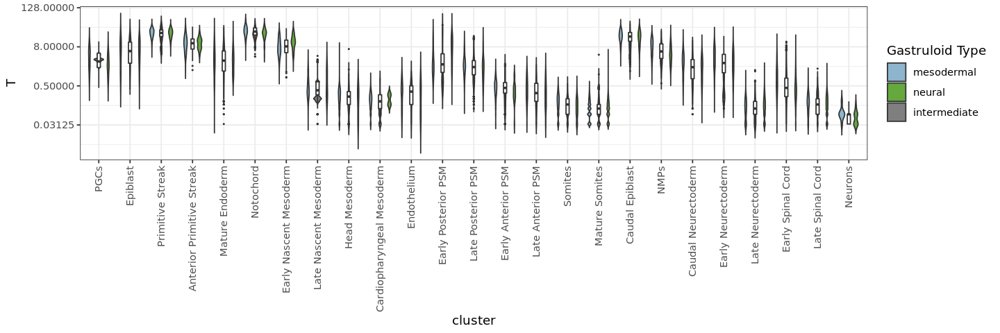

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 1289 rows containing non-finite values (stat_boxplot).”


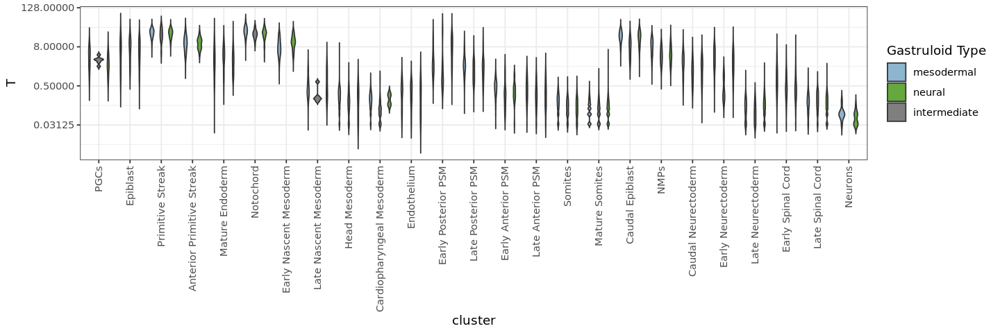

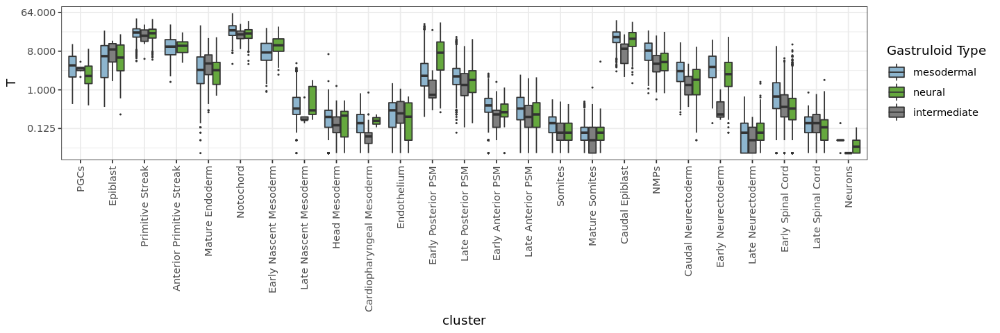

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 1289 rows containing non-finite values (stat_boxplot).”


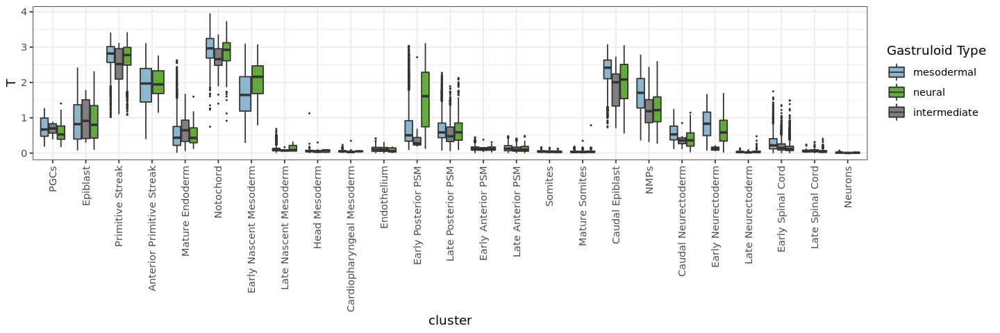

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 1575 rows containing non-finite values (stat_boxplot).”


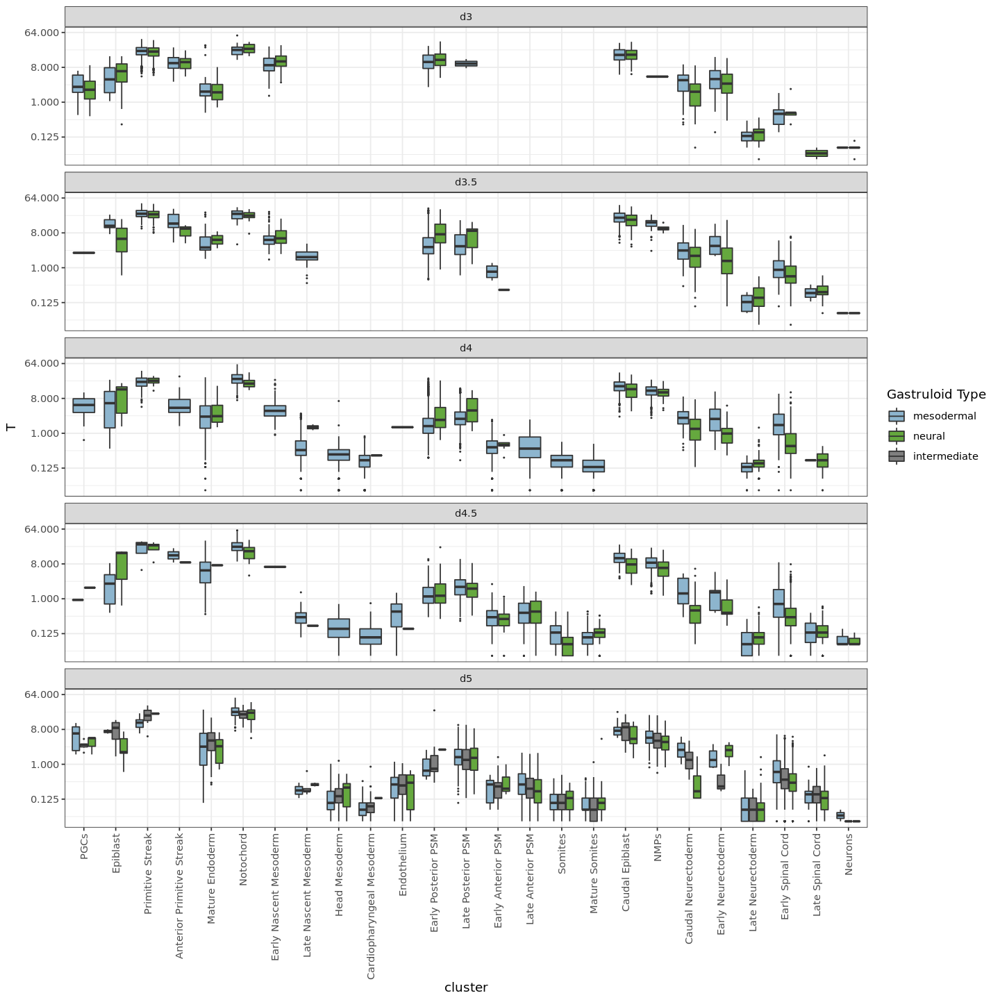

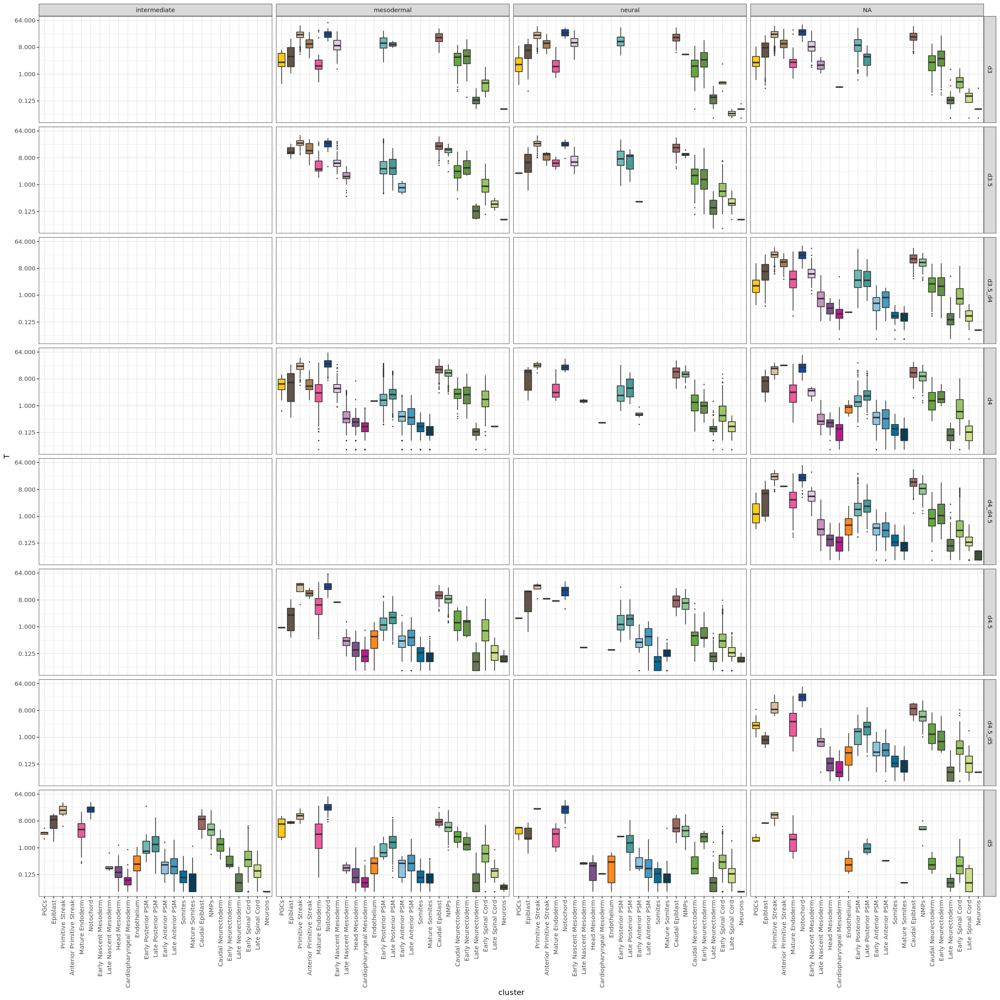

In [12]:
options(repr.plot.width=12, repr.plot.height=4)
plotGeneViolins(srat, gene_symbol = 'T', fill_by="gastr_type")
plotGeneViolins(srat, gene_symbol = 'T', fill_by="gastr_type", plot_type = "violin")
plotGeneViolins(srat, gene_symbol = 'T', fill_by="gastr_type", plot_type = "boxplot")
plotGeneViolins(srat, gene_symbol = 'T', type="normalised", fill_by="gastr_type", plot_type = "boxplot")

options(repr.plot.width=12, repr.plot.height=12)
plotGeneViolins(srat, gene_symbol = 'T', fill_by="gastr_type", plot_type = "boxplot") +
    facet_wrap(~timepoint, ncol=1)

options(repr.plot.width=20, repr.plot.height=20)
plotGeneViolins(srat, gene_symbol = 'T', plot_type = "boxplot") +
    facet_grid(timepoint ~ gastr_type)

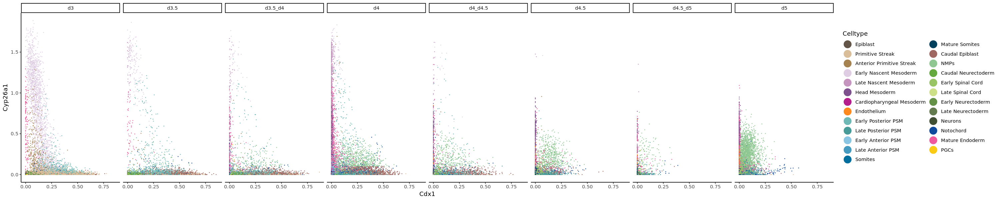

In [13]:
options(repr.plot.width=25, repr.plot.height=5)
plotGeneCorrelation(srat, gene1_symbol="Cdx1", gene2_symbol="Cyp26a1", smoothed=TRUE, type='normalised', assay='RNA') + facet_wrap(~timepoint, nrow = 1)

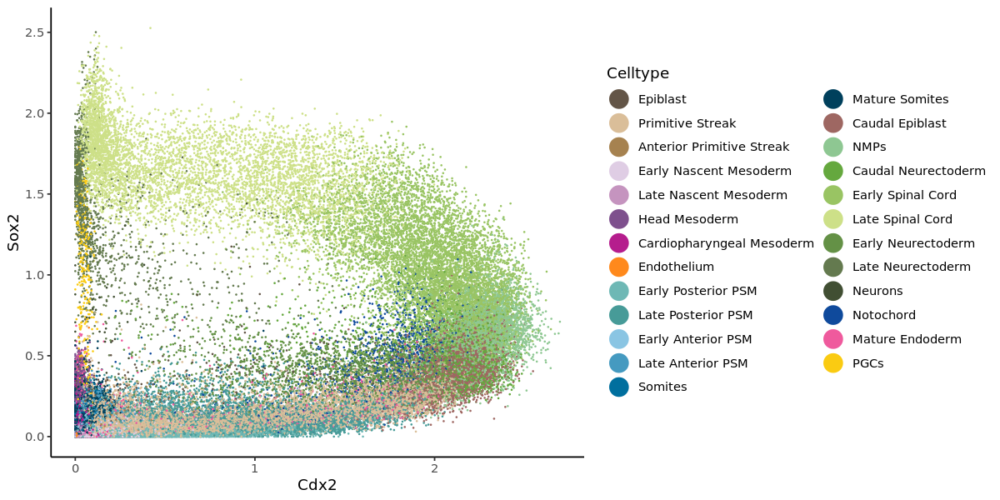

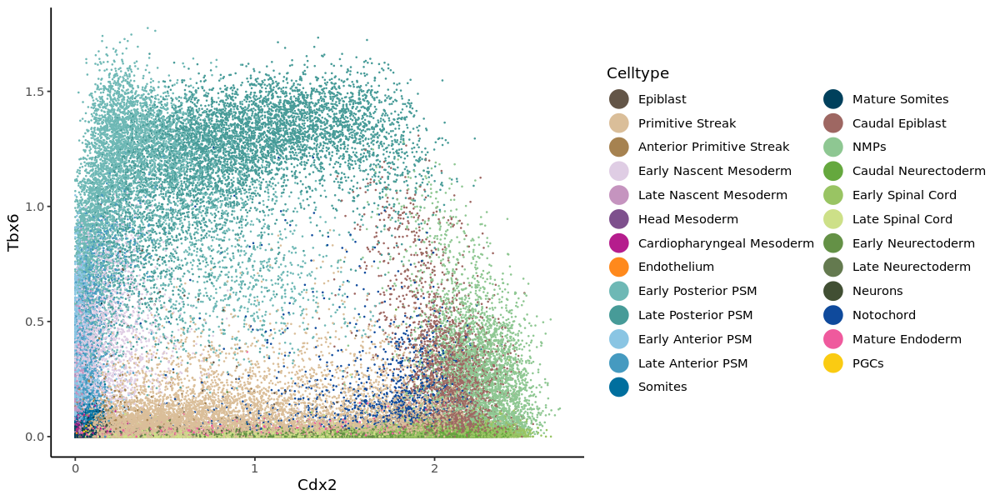

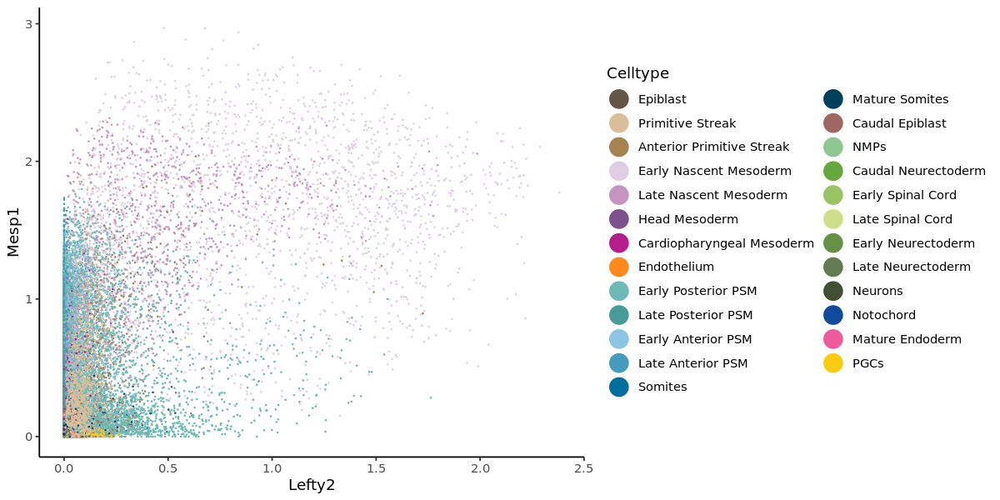

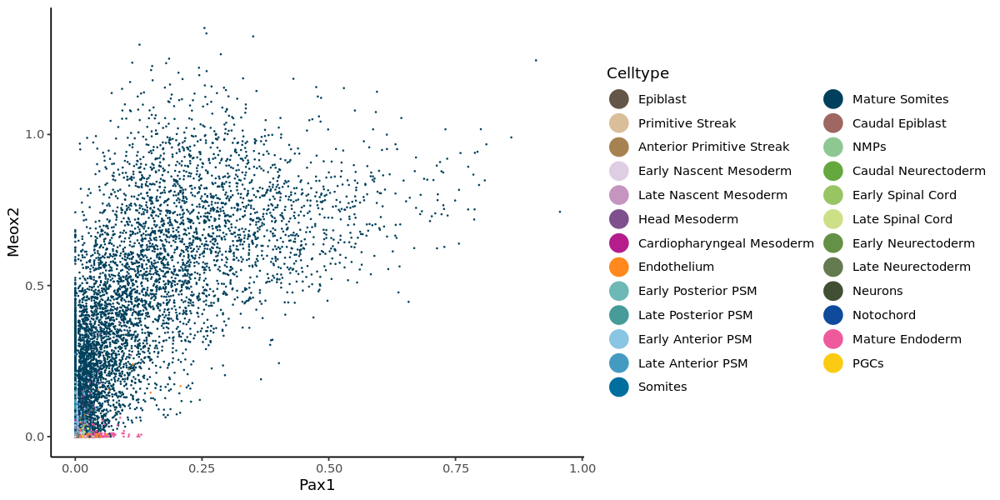

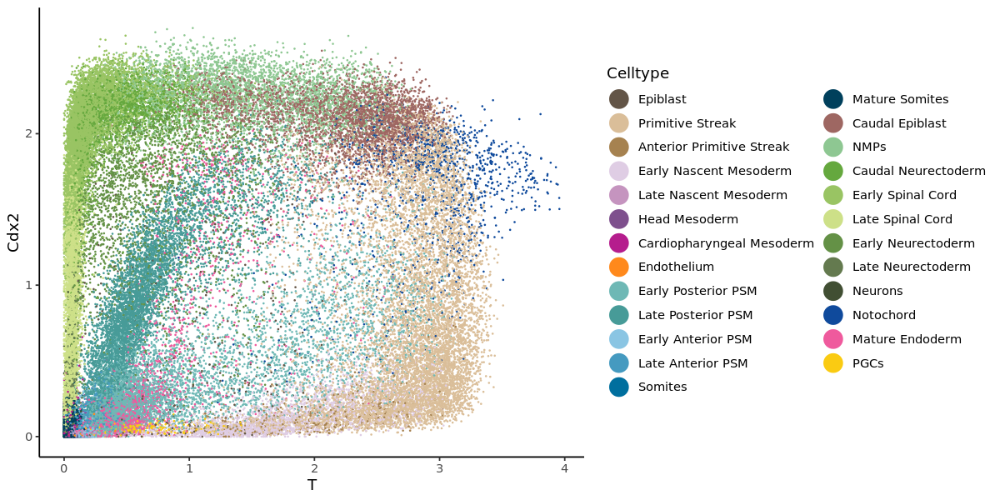

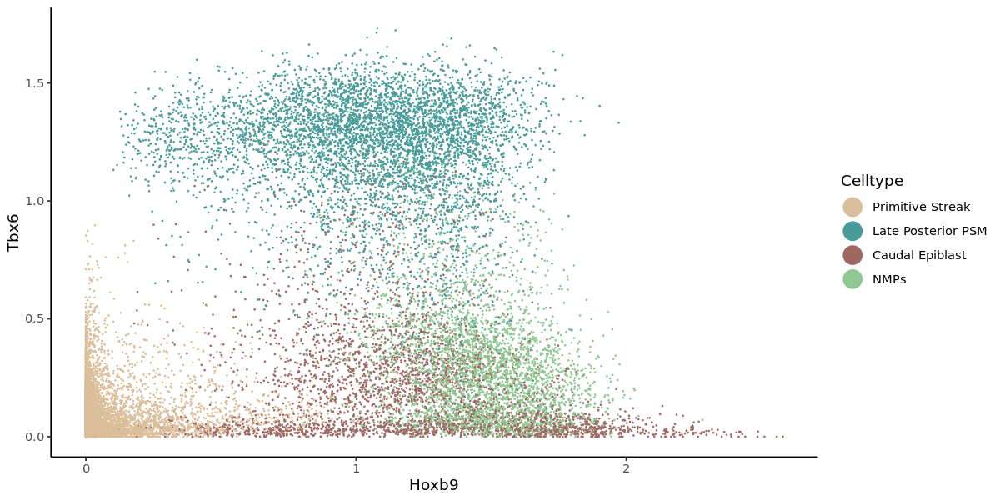

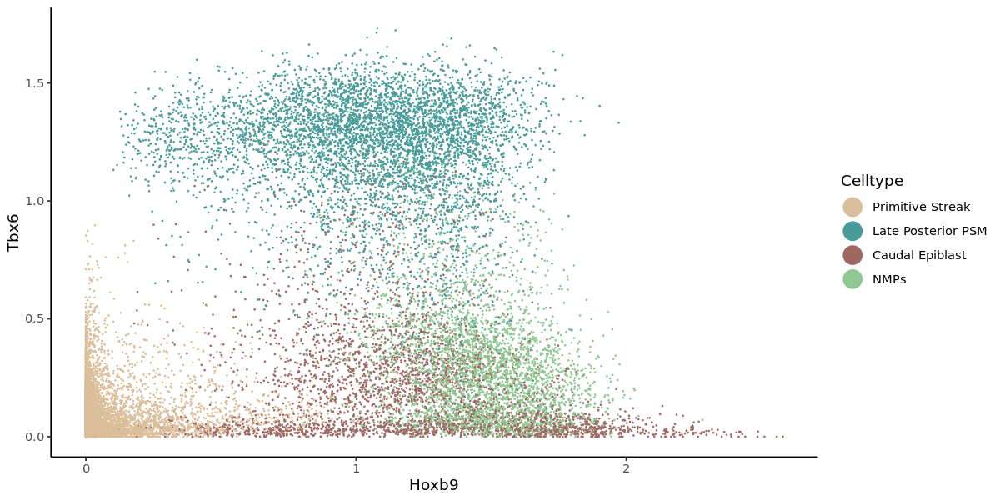

In [15]:
options(repr.plot.width=10, repr.plot.height=5)
plotGeneCorrelation(srat, gene1_symbol="Cdx2", gene2_symbol="Sox2", smoothed=TRUE, type='normalised', assay='RNA')
plotGeneCorrelation(srat, gene1_symbol="Cdx2", gene2_symbol="Tbx6", smoothed=TRUE, type='normalised', assay='RNA')
plotGeneCorrelation(srat, gene1_symbol="Lefty2", gene2_symbol="Mesp1", smoothed=TRUE, type='normalised', assay='RNA')
plotGeneCorrelation(srat, gene1_symbol="Pax1", gene2_symbol="Meox2", smoothed=TRUE, type='normalised', assay='RNA')
plotGeneCorrelation(srat, gene1_symbol="T", gene2_symbol="Cdx2", smoothed=TRUE, type='normalised', assay='RNA')
plotGeneCorrelation(srat, gene1_symbol="Hoxb9", gene2_symbol="Tbx6", smoothed=TRUE, type='normalised', assay='RNA', cluster_subset = c("Late Posterior PSM", "Primitive Streak", "Caudal Epiblast", "NMPs"))
plotGeneCorrelation(srat, gene1_symbol="Hoxb9", gene2_symbol="Tbx6", smoothed=TRUE, type='normalised', assay='RNA', cluster_subset = c("Late Posterior PSM", "Primitive Streak", "Caudal Epiblast", "NMPs"))